Import de bibliotecas

In [120]:
import pandas as pd
import numpy as np
from numpy import nan
#!pip install pandas_profiling 
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import pycaret
from pycaret.regression import *
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from scipy import stats
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

Import do arquivo

In [62]:
df = pd.read_csv("uber.csv")

Análises preliminares

In [4]:
df.head(3)

,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,2015-05-07 19:52:06.0000003,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,27835199,2009-07-17 20:04:56.0000002,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,44984355,2009-08-24 21:45:00.00000061,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         200000 non-null  int64  
 1   key                200000 non-null  object 
 2   fare_amount        200000 non-null  float64
 3   pickup_datetime    200000 non-null  object 
 4   pickup_longitude   200000 non-null  float64
 5   pickup_latitude    200000 non-null  float64
 6   dropoff_longitude  199999 non-null  float64
 7   dropoff_latitude   199999 non-null  float64
 8   passenger_count    200000 non-null  int64  
dtypes: float64(5), int64(2), object(2)
memory usage: 13.7+ MB


Temos dois registros com valores nulos, como são poucos registros vamos removê-los

In [63]:
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199999 entries, 0 to 199999
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         199999 non-null  int64  
 1   key                199999 non-null  object 
 2   fare_amount        199999 non-null  float64
 3   pickup_datetime    199999 non-null  object 
 4   pickup_longitude   199999 non-null  float64
 5   pickup_latitude    199999 non-null  float64
 6   dropoff_longitude  199999 non-null  float64
 7   dropoff_latitude   199999 non-null  float64
 8   passenger_count    199999 non-null  int64  
dtypes: float64(5), int64(2), object(2)
memory usage: 15.3+ MB


Os campos de key e	pickup_datetime trazem basicamente o mesmo dado, vamos manter apenas uma das colunas

In [64]:
df[['key','pickup_datetime']]

,key,pickup_datetime
0,2015-05-07 19:52:06.0000003,2015-05-07 19:52:06 UTC
1,2009-07-17 20:04:56.0000002,2009-07-17 20:04:56 UTC
2,2009-08-24 21:45:00.00000061,2009-08-24 21:45:00 UTC
3,2009-06-26 08:22:21.0000001,2009-06-26 08:22:21 UTC
4,2014-08-28 17:47:00.000000188,2014-08-28 17:47:00 UTC
...,...,...
199995,2012-10-28 10:49:00.00000053,2012-10-28 10:49:00 UTC
199996,2014-03-14 01:09:00.0000008,2014-03-14 01:09:00 UTC
199997,2009-06-29 00:42:00.00000078,2009-06-29 00:42:00 UTC
199998,2015-05-20 14:56:25.0000004,2015-05-20 14:56:25 UTC


Removendo a coluna key e separando os dados de dia e horário da pickup_datetime em colunas diferentes

In [65]:
df = df.drop(columns=['key'])

In [66]:
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])

df['pickup_ano'] = df['pickup_datetime'].dt.year
df['pickup_mes'] = df['pickup_datetime'].dt.month
df['pickup_dia'] = df['pickup_datetime'].dt.day

df['pickup_hora'] = df['pickup_datetime'].dt.hour
df['pickup_minutos'] = df['pickup_datetime'].dt.minute
df['pickup_segundos'] = df['pickup_datetime'].dt.second

In [10]:
df.head(2)

,Unnamed: 0,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,pickup_ano,pickup_mes,pickup_dia,pickup_hora,pickup_minutos,pickup_segundos
0,24238194,7.5,2015-05-07 19:52:06+00:00,-73.999817,40.738354,-73.999512,40.723217,1,2015,5,7,19,52,6
1,27835199,7.7,2009-07-17 20:04:56+00:00,-73.994355,40.728225,-73.994710,40.750325,1,2009,7,17,20,4,56


In [67]:
df.drop(columns=['pickup_datetime'],inplace=True)

Agora todos os nossos dados são númericos e não nulos

In [68]:
df = df.rename(columns={'Unnamed: 0': 'codigo_corrida'})

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199999 entries, 0 to 199999
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   codigo_corrida     199999 non-null  int64  
 1   fare_amount        199999 non-null  float64
 2   pickup_longitude   199999 non-null  float64
 3   pickup_latitude    199999 non-null  float64
 4   dropoff_longitude  199999 non-null  float64
 5   dropoff_latitude   199999 non-null  float64
 6   passenger_count    199999 non-null  int64  
 7   pickup_ano         199999 non-null  int64  
 8   pickup_mes         199999 non-null  int64  
 9   pickup_dia         199999 non-null  int64  
 10  pickup_hora        199999 non-null  int64  
 11  pickup_minutos     199999 non-null  int64  
 12  pickup_segundos    199999 non-null  int64  
dtypes: float64(5), int64(8)
memory usage: 21.4 MB


Análise das variáveis

In [14]:
profile = ProfileReport(df, title='Análise de Variáveis')
#profile.to_widgets()

In [ ]:
from IPython.core.display import display, HTML

profile = ProfileReport(df, title='Análise de Variáveis', explorative=True)
display(HTML(profile.to_html()))

Analisando o relatório gerado podemos fazer algumas conclusões:


- De um modo geral não encontramos boas correlações entre as variáveis e o valor da tarifa;
- Analisando a variável de ano, notamos que os registros vão de 2009 até 2015, sendo que 2015 tem praticamente metade dos registros dos outros anos, o que sugere que para este ano provavemente não temos dados de janeiro a dezembro. Outro ponto interessante é que percebemos uma crescente de registros até o ano de 2012, em seguida a quantidade de registros começa a cair. É claro que a base é só uma amostra, mas pode indicar uma possível redução de participação no mercado. O que faz sentido, já que temos os novos concorrentes da Uber sendo criados a partir de 2012, como a 99, Lyft e a Didi Chuxing.
- A variável de quantidade de passageiros vai de 0 até 6. Uma possibilidade para 0 passageiros, é a utilização do serviço para entrega de objetos. 70% das corridas levam 1 passageiro, 15% levam 2. E apenas 15% levam 3 ou mais passageiros.
- A variável de hora é interessante também, ela mostra que a partir da meia noite a quantidade de corridas vão caindo até as 6h, horário que as pessoas começam a precisar do serviço para ir para o trabalho. A crescente vai até perto por volta do meio dia, quando começa a cair novamente até as 18h, horário que novamente as pessoas precisam do serviço para sair do trabalho e voltar para casa. A crescente vai até as 20h e 21h, quando começa a cair. Esse horário das 20h e 21h é o horário com mais corridas, isso provavelmente se deve ao fato de que contempla pessoas que estão saindo tarde do serviço e por isso acabam utilizando do serviço para ir para casa e também porque é um horário que possivelmente as pessoas também estão saindo de casa para jantar ou sair a noite.

In [25]:
print(f"Quatidade de registros da base: ",df.shape[0])
print(f"Quatidade de registros distintos da váriavel código corrida: ",df['codigo_corrida'].nunique())

Quatidade de registros da base:  199999
Quatidade de registros distintos da váriavel código corrida:  199999


- Como era de se imaginar o código da corrida não se repete, sendo assim, podemos retirá-lo da base, porque este campo não vai ajudar em nada o modelo.

In [29]:
#Análise da variável de tarifa
df['fare_amount'].describe()

count    199999.000000
mean         11.359892
std           9.901760
min         -52.000000
25%           6.000000
50%           8.500000
75%          12.500000
max         499.000000
Name: fare_amount, dtype: float64

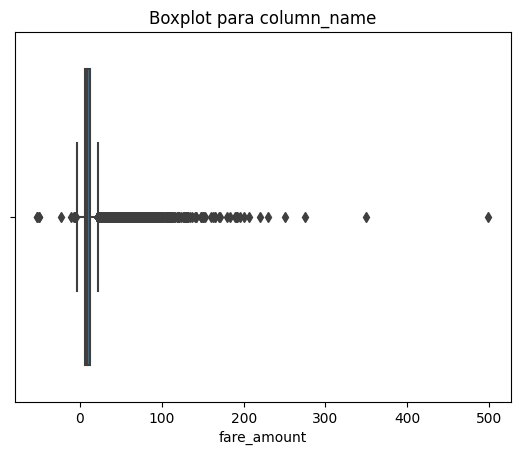

In [28]:
sns.boxplot(data=df, x='fare_amount')

# Definindo um título para o gráfico
plt.title('Boxplot da Tarifa')
plt.show()

A variável de valor de tarifa varia de -52 até 499. O primeiro, segundo e terceiro quartil tem os valores de 6, 8.5 e 12.5, o que já nos mostra que se temos valores de 499, temos outliers nos dados. O intervalo interquartilico é de 6.5, ou seja, a maior parte dos valores se concentram em um range pequeno. Isso sugere que a maioria das corridas são próximas, iremos avaliar este ponto avaliando as distancias de origem e destino das corridas. Também iremos excluir os outliers negativos para não prejudicar o modelo de projeção.

Vamos retirar a variável de código e trabalhar um pouco de feature engineering

In [109]:
df.drop(columns=['codigo_corrida'],inplace=True)

Incluindo a variável de distância

In [31]:
#definir do raio da terra utilizado na formula
R = 6371.0 # raio da Terra em km

#conversão de graus para radianos
lat1_rad = np.radians(df['pickup_latitude'])
lon1_rad = np.radians(df['pickup_longitude'])
lat2_rad = np.radians(df['dropoff_latitude'])
lon2_rad = np.radians(df['dropoff_longitude'])

#calculo das diferenças
dlon = lon2_rad - lon1_rad
dlat = lat2_rad - lat1_rad

#aplicação da formula de Haversine
a = np.sin(dlat / 2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon / 2)**2
c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

#calculo da distância
distance = R * c

#adicionando a nova coluna ao df
df['distancia'] = distance

Visuzaliação dos pontos de origem de corrida e de destino

In [ ]:
import folium

#Usaremos as medianas de latitude  e longitude para centralizar o mapa
df_sample = df.sample(frac=0.05)
m = folium.Map(location=[df_sample['pickup_latitude'].median(), df_sample['pickup_longitude'].median()], zoom_start=13)

#traçando os pontos de origem
for idx, row in df_sample.iterrows():
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']], 
        radius=3,
        color="none",
        fill=True,
        fill_color="green",
        fill_opacity=0.2,
    ).add_to(m)

#traçando os pontos de destino
for idx, row in df_sample.iterrows():
    folium.CircleMarker(
        location=[row['dropoff_latitude'], row['dropoff_longitude']], 
        radius=3,
        color="none",
        fill=True,
        fill_color="red",
        fill_opacity=0.2,
    ).add_to(m)

# Finalmente, mostrar o mapa
m

Pontos verdes são pontos de partida e os vermelho de chegada. Como é possível notar, a cidade dos dados é Nova York. E diferente de São Paulo, ela não possui regiões predominantemente mais residencias ou comerciais, é muito mais misturado, motivo pelo qual os pontos dificilmente apresentam uma predominância maior de cor.

Um ponto interessante para avaliarmos seria se existe concentração de corridas em determinadas regiões dependendo da faixa de horário. Para isso, vamos incluir uma variável de faixa de horário nos dados.

In [95]:
bins = [0, 6, 12, 18, 21, 24]
labels = ['0-6', '6-12', '12-18', '18-21', '21-24']

df['pickup_hora'] = df['pickup_hora']
df['time_period'] = pd.cut(df['pickup_hora'], bins=bins, labels=labels, include_lowest=True, right=False)
df_dummies = pd.get_dummies(df['time_period'], prefix='time')
df = pd.concat([df, df_dummies], axis=1)

Agora vamos visualizar a plotagem destas corridas separando através das cores as faixas de horário

In [96]:
color_dict = {
    '0-6': ['lightblue', 'darkblue'],
    '6-12': ['lightgreen', 'darkgreen'],
    '12-18': ['lightcoral', 'darkred'],
    '18-21': ['lightgray', 'darkgray'],
    '21-24': ['yellow', 'gold'],
}

In [98]:
df_sample = df.sample(frac=0.05)

m = folium.Map(location=[df_sample['pickup_latitude'].median(), df_sample['pickup_longitude'].median()], zoom_start=11)

#para cada linha no dataframe de amostra, vamos traçar um marcador no mapa para o local de origem e destino
for idx, row in df_sample.iterrows():
    time_period = row['time_period']
    #pontos de origem
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']], 
        radius=3,
        color="none",
        fill=True,
        fill_color=color_dict[time_period][0], # cor para o local de origem
        fill_opacity=0.7,
    ).add_to(m)
    
    #pontos de destino
    folium.CircleMarker(
        location=[row['dropoff_latitude'], row['dropoff_longitude']], 
        radius=3,
        color="none",
        fill=True,
        fill_color=color_dict[time_period][1], # cor para o local de destino
        fill_opacity=0.7,
    ).add_to(m)

m

* O primeiro ponto que chama mais atenção são os pontos azuis que tem mais frequência nas extremidades de Nova York, como nas regiões do Brooklyn e Queens, estes pontos azuis representam as corridas feitas após a meia noite até as 6h. Apesar de não serem os distritos com os maiores indices de criminalidade, também não ficam entre os melhores, e portanto a questão de segurança pode ser uma variável importante para entendermos porque há uma predominância maior de corridas nesses horários para essas regiões.


* Os próximos pontos não são tão nítidos, iguais aos azuis, mas se calibrarmos o zoom conseguimos notar algumas concentrações.
*  Os pontos verdes próximos a região de Manhattan fazem todo o sentido, já que indicam os horários de corrida entre as 6h e meio dia. É o público que utiliza da Uber para ir trabalhar, considerando que Manhattan é provavelmente a principão região comercial de Nova York.
*  Em seguida notamos pontos vermelhos mais acima, em torno do Central Park, os pontos vermelho indicam corridas após o meio dia e podem indicar um público que frequenta o Central Park no período da tarde.



No gráfico acima trabalhamos apenas com uma amostragem dos dados e como os pontos se misturam muito é necessário validarmos as análises que fizemos avaliando 100% dos dados, uma possibilidade é categorizando cada corrida de acordo com o distrito de chegada e origem e em seguida vamos entender qual é a proporção de corridas em cada faixa de horário por distrito.

In [99]:
coordenadas_distrito = {
    "Manhattan": [40.7831, -73.9712],
    "Brooklyn": [40.6782, -73.9442],
    "Queens": [40.7282, -73.7949],
    "The Bronx": [40.8448, -73.8648],
    "Staten Island": [40.5795, -74.1502]
}

In [100]:
from math import radians, cos, sin, asin, sqrt

def haversine(lon1, lat1, lon2, lat2):
    #converter coordenadas de graus para radianos
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    #formula de Haversine
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 #raio da Terra em quilômetros
    return c * r

In [101]:
def assign_borough_origem(row):
    dropoff_lat, dropoff_lon = row['dropoff_latitude'], row['dropoff_longitude']

    min_distance = float('inf')
    borough = ''

    for b, coordinates in coordenadas_distrito.items():
        dropoff_distance = haversine(dropoff_lon, dropoff_lat, coordinates[1], coordinates[0])

        if dropoff_distance < min_distance:
            min_distance = dropoff_distance
            borough = b

    return borough

df['borough_origem'] = df.apply(assign_borough_origem, axis=1)

In [102]:
def assign_borough_chegada(row):
    dropoff_lat, dropoff_lon = row['pickup_latitude'], row['pickup_longitude']

    min_distance = float('inf')
    borough = ''

    for b, coordinates in coordenadas_distrito.items():
        dropoff_distance = haversine(dropoff_lon, dropoff_lat, coordinates[1], coordinates[0])

        if dropoff_distance < min_distance:
            min_distance = dropoff_distance
            borough = b

    return borough

df['borough_chegada'] = df.apply(assign_borough_chegada, axis=1)

Análisando o distrito de origem


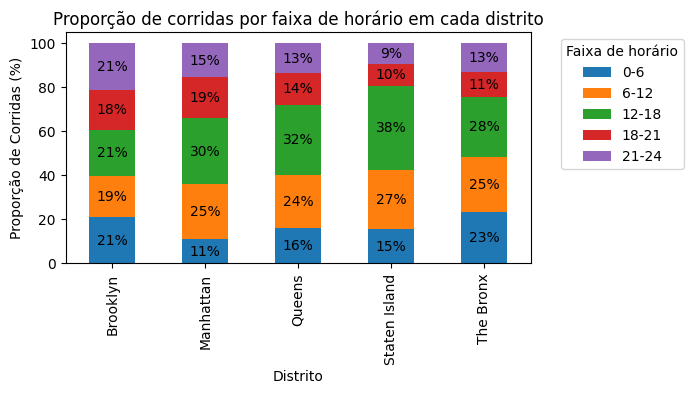

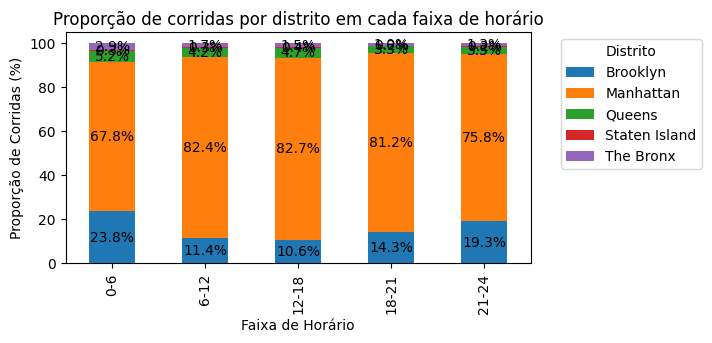

Análisando o distrito de chegada


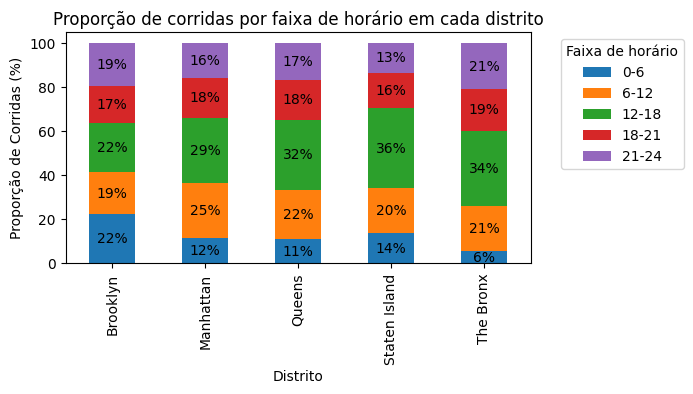

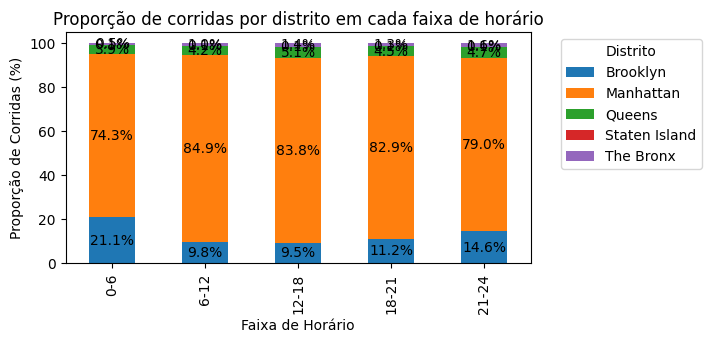

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

print("Análisando o distrito de origem")

#agrupar dados
grouped = df.groupby(['borough_origem', 'time_period']).size().unstack(fill_value=0)

#normalizar as linhas para que a soma seja 1, isso nos permitirá visualizar as proporções
#multiplicando por 100 para obter os valores em percentagem
grouped = grouped.div(grouped.sum(axis=1), axis=0) * 100

#plotar gráfico
ax = grouped.plot(kind='bar', stacked=True, figsize=(6,3))

#configurar o gráfico
plt.title('Proporção de corridas por faixa de horário em cada distrito')
plt.xlabel('Distrito')
plt.ylabel('Proporção de Corridas (%)')

#mostrar legenda fora do gráfico
plt.legend(title='Faixa de horário', bbox_to_anchor=(1.05, 1), loc='upper left')

#adicionar rótulos
for container in ax.containers:
    ax.bar_label(container, fmt='%.f%%', label_type='center')

plt.show()


#agrupar dados
grouped = df.groupby(['time_period', 'borough_origem']).size().unstack(fill_value=0)

#normalizar as linhas para que a soma seja 1, isso nos permitirá visualizar as proporções
#multiplicando por 100 para obter os valores em percentagem
grouped = grouped.div(grouped.sum(axis=1), axis=0) * 100

#plotar gráfico
ax = grouped.plot(kind='bar', stacked=True, figsize=(6,3))

#configurar o gráfico
plt.title('Proporção de corridas por distrito em cada faixa de horário')
plt.xlabel('Faixa de Horário')
plt.ylabel('Proporção de Corridas (%)')

#mostrar legenda fora do gráfico
plt.legend(title='Distrito', bbox_to_anchor=(1.05, 1), loc='upper left')

#adicionar rótulos no centro dos segmentos de barra
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center')

plt.show()

print("Análisando o distrito de chegada")

#agrupar dados
grouped = df.groupby(['borough_chegada', 'time_period']).size().unstack(fill_value=0)

#normalizar as linhas para que a soma seja 1, isso nos permitirá visualizar as proporções
#multiplicando por 100 para obter os valores em percentagem
grouped = grouped.div(grouped.sum(axis=1), axis=0) * 100

#plotar gráfico
ax = grouped.plot(kind='bar', stacked=True, figsize=(6,3))

#configurar o gráfico
plt.title('Proporção de corridas por faixa de horário em cada distrito')
plt.xlabel('Distrito')
plt.ylabel('Proporção de Corridas (%)')

#mostrar legenda fora do gráfico
plt.legend(title='Faixa de horário', bbox_to_anchor=(1.05, 1), loc='upper left')

#adicionar rótulos
for container in ax.containers:
    ax.bar_label(container, fmt='%.f%%', label_type='center')

plt.show()


#agrupar dados
grouped = df.groupby(['time_period', 'borough_chegada']).size().unstack(fill_value=0)

#normalizar as linhas para que a soma seja 1, isso nos permitirá visualizar as proporções
#multiplicando por 100 para obter os valores em percentagem
grouped = grouped.div(grouped.sum(axis=1), axis=0) * 100

#plotar gráfico
ax = grouped.plot(kind='bar', stacked=True, figsize=(6,3))

#configurar o gráfico
plt.title('Proporção de corridas por distrito em cada faixa de horário')
plt.xlabel('Faixa de Horário')
plt.ylabel('Proporção de Corridas (%)')

#mostrar legenda fora do gráfico
plt.legend(title='Distrito', bbox_to_anchor=(1.05, 1), loc='upper left')

#adicionar rótulos no centro dos segmentos de barra
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center')

plt.show()


Com os gráficos acima conseguirmos ter novos insights sobre os dados e confirmamos alguns pontos que notamos no gráfico do mapa. 

*   Independente do horário Manhattan tem a maior representatividade de corridas em relação aos outros distritos, e isso é um ponto muito relevante dos dados porque Manhattan tem só a terceira maior população dos 5 distritos. Uma possível explicação, é que a concetração de negócios e turismo é um fator de muito peso para as corridas que envolvem Manhattan, mas considerando os dados de população e a grande diferença de corridas em relação aos outros distritos devemos considerar como a possibilidade mais provável a de que a base contém apenas parte das corridas de Nova York e tendo como corte alguma uma referência próxima a Manhatan.    



*   Brooklyn e Broxn tem de fato uma maior concentração em percentual de corridas de destino após às 21h do que os outros distritos, reforçando a nossa hipótese sobre segurança.



## Criação do Modelo

Antes de criar o modelo vamos eliminar registros que não tenham valor de tarifa ou tenham valores negativos.

In [105]:
df = df[df['fare_amount']>0]

In [106]:
df.shape

(199977, 21)

Perdemos apenas 22 registros com a exclusão, agora vamos avaliar se tem mais alguma coluna que devemos excluir.

In [110]:
df.columns

Index(['fare_amount', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'passenger_count',
       'pickup_ano', 'pickup_mes', 'pickup_dia', 'pickup_hora',
       'pickup_minutos', 'pickup_segundos', 'time_period', 'time_0-6',
       'time_6-12', 'time_12-18', 'time_18-21', 'time_21-24', 'borough_origem',
       'borough_chegada'],
      dtype='object')

Vamos excluir as colunas de pickup_segundos que não deve agregar para o modelo e vamos também excluir time_period, já que transformamos em dummies este dado. Também vamos transformar em dummie a coluna borough_origem e borough_chegada.

In [111]:
df = df.drop(columns=['pickup_segundos', 'time_period'])

In [114]:
df_dummies_borough_origem = pd.get_dummies(df['borough_origem'], prefix='origem')
df_dummies_borough_chegada = pd.get_dummies(df['borough_chegada'], prefix='chegada')
df = pd.concat([df, df_dummies_borough_origem], axis=1)
df = pd.concat([df, df_dummies_borough_chegada], axis=1)

In [115]:
df = df.drop(columns=['borough_origem', 'borough_chegada'])

In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199977 entries, 0 to 199999
Data columns (total 26 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   fare_amount            199977 non-null  float64
 1   pickup_longitude       199977 non-null  float64
 2   pickup_latitude        199977 non-null  float64
 3   dropoff_longitude      199977 non-null  float64
 4   dropoff_latitude       199977 non-null  float64
 5   passenger_count        199977 non-null  int64  
 6   pickup_ano             199977 non-null  int64  
 7   pickup_mes             199977 non-null  int64  
 8   pickup_dia             199977 non-null  int64  
 9   pickup_hora            199977 non-null  int64  
 10  pickup_minutos         199977 non-null  int64  
 11  time_0-6               199977 non-null  uint8  
 12  time_6-12              199977 non-null  uint8  
 13  time_12-18             199977 non-null  uint8  
 14  time_18-21             199977 non-nu

In [118]:
!pip install pycaret
!pip install xgboost==1.7.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 483.6/483.6 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 21.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 6.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 6.0 MB/s eta 0:00:00

In [119]:
df.columns

Index(['fare_amount', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'passenger_count',
       'pickup_ano', 'pickup_mes', 'pickup_dia', 'pickup_hora',
       'pickup_minutos', 'time_0-6', 'time_6-12', 'time_12-18', 'time_18-21',
       'time_21-24', 'origem_Brooklyn', 'origem_Manhattan', 'origem_Queens',
       'origem_Staten Island', 'origem_The Bronx', 'chegada_Brooklyn',
       'chegada_Manhattan', 'chegada_Queens', 'chegada_Staten Island',
       'chegada_The Bronx'],
      dtype='object')

Configuração do pycaret

In [121]:
s = setup(data = df, 
          target = 'fare_amount', 
          remove_outliers = False,
          session_id = 123)

,Description,Value
0,Session id,123
1,Target,fare_amount
2,Target type,Regression
3,Original data shape,"(199977, 26)"
4,Transformed data shape,"(199977, 26)"
5,Transformed train set shape,"(139983, 26)"
6,Transformed test set shape,"(59994, 26)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


Vamos rankear os modelos através da métrica de RMSE. Já que o nosso objetivo é ter um modelo que erre o menos possível em relação ao valor que deveria ser cobrado de tarifa, esta parece ser uma métrica adequada, além do resultado dessa métrica já ser um valor de erro médio na mesma escala do dado, e portanto de mais fácil interpretação.

In [122]:
best_model = compare_models(sort = 'RMSE', errors = 'raise')

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,21:07:02
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Extra Trees Regressor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,2.0316,22.7644,4.7384,0.7718,0.2608,0.2256,173.5420
dt,Decision Tree Regressor,2.9033,45.0873,6.6917,0.5434,0.3571,0.3105,3.0850
ridge,Ridge Regression,4.5904,60.4679,7.7562,0.3896,0.4619,0.5176,0.2330
br,Bayesian Ridge,4.5904,60.4770,7.7567,0.3895,0.4619,0.5176,0.3880
lr,Linear Regression,4.5903,60.4842,7.7571,0.3895,0.4619,0.5176,1.4870
en,Elastic Net,5.8057,93.1504,9.6454,0.0567,0.5542,0.6360,0.3120
lasso,Lasso Regression,5.8128,93.5404,9.6655,0.0528,0.5558,0.6374,0.4970
llar,Lasso Least Angle Regression,5.8128,93.5404,9.6655,0.0528,0.5558,0.6374,0.2450
omp,Orthogonal Matching Pursuit,5.9714,97.3334,9.8600,0.0142,0.5701,0.6514,0.1940
huber,Huber Regressor,5.2674,98.4858,9.9168,0.0029,0.5250,0.4641,3.9950


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,2.0316,22.7644,4.7384,0.7718,0.2608,0.2256,173.5420
xgboost,Extreme Gradient Boosting,2.0796,23.4875,4.8144,0.7644,0.2653,0.2326,24.8110
lightgbm,Light Gradient Boosting Machine,2.3015,24.0368,4.8670,0.7592,0.2861,0.2677,1.6190
et,Extra Trees Regressor,2.0838,24.1655,4.8873,0.7574,0.2678,0.2364,94.9910
gbr,Gradient Boosting Regressor,2.9904,28.6724,5.3295,0.7118,0.3478,0.3572,25.6840
dt,Decision Tree Regressor,2.9033,45.0873,6.6917,0.5434,0.3571,0.3105,3.0850
ridge,Ridge Regression,4.5904,60.4679,7.7562,0.3896,0.4619,0.5176,0.2330
br,Bayesian Ridge,4.5904,60.4770,7.7567,0.3895,0.4619,0.5176,0.3880
lr,Linear Regression,4.5903,60.4842,7.7571,0.3895,0.4619,0.5176,1.4870
en,Elastic Net,5.8057,93.1504,9.6454,0.0567,0.5542,0.6360,0.3120


Random Forest Regressor e Xgboost, foram os dois melhores modelos. Seguiremos com o Xgboost.

In [123]:
mdl_xg = create_model('xgboost')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2.0899,37.0057,6.0832,0.6615,0.2644,0.2199
1,2.0508,17.8983,4.2306,0.8024,0.2635,0.2178
2,2.0992,23.5083,4.8485,0.7746,0.2696,0.2214
3,2.1373,25.8629,5.0856,0.7517,0.2692,0.2272
4,2.0851,19.4399,4.4091,0.7911,0.2661,0.2234
5,2.0426,19.1385,4.3748,0.7927,0.2661,0.2287
6,2.0242,22.3637,4.7290,0.7625,0.2589,0.2145
7,2.0701,18.0161,4.2445,0.8093,0.2605,0.3318
8,2.1355,29.3736,5.4197,0.7289,0.2708,0.2239


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

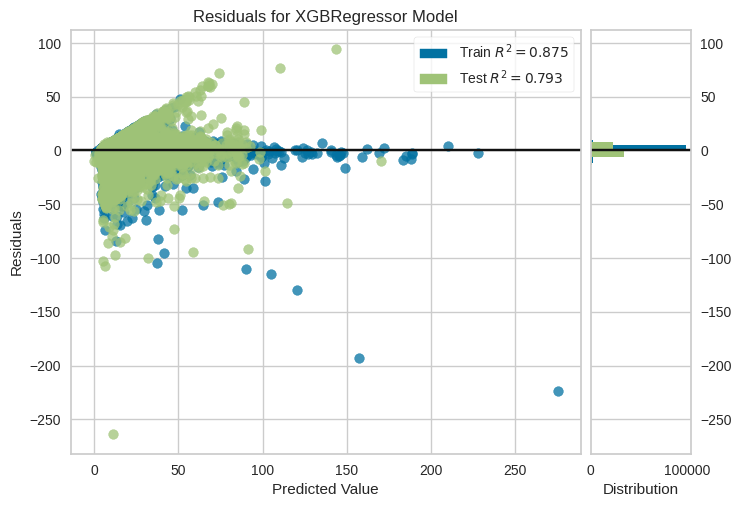

In [131]:
for model in [mdl_xg]:
  plot_model(mdl_xg)

In [135]:
comp_models = []
pred_xg = predict_model(mdl_xg)
r2_xg= r2_score(pred_xg['fare_amount'], pred_xg['prediction_label'])
comp_models.append(('pycaret_RF', np.round(r2_xg,4)))

display(comp_models)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extreme Gradient Boosting,2.0889,19.9004,4.4610,0.7930,0.2657,0.2363


[('pycaret_RF', 0.793)]

Além do Xgboost atingir um bom valor de 0.79 de r² na base de teste, os valores de RMSE ficaram abaixo de 5, indicando um residuo controlável. Além destes pontos, notamos também no gráfico acima que os residuos da base de treino e teste tiveram um desenho similar, afastando a hipóteses de overfitting na base de treino.

In [127]:
finalize_model(mld_xg)

Pipeline(memory=FastMemory(location=/tmp/joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['pickup_longitude',
                                             'pickup_latitude',
                                             'dropoff_longitude',
                                             'dropoff_latitude',
                                             'passenger_count', 'pickup_ano',
                                             'pickup_mes', 'pickup_dia',
                                             'pickup_hora', 'pickup_minutos',
                                             'time_0-6', 'time_6-12',
                                             'time_12-18', 'time_18-21',
                                             'time_21-24', 'origem_Brooklyn',
                                             '...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=-1, num_parallel_tree=None, predictor=None,
                              random_state=123, ...))])

In [128]:
save_model(mdl_xg, 'pycaret_mdl_xg')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=/tmp/joblib),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['pickup_longitude',
                                              'pickup_latitude',
                                              'dropoff_longitude',
                                              'dropoff_latitude',
                                              'passenger_count', 'pickup_ano',
                                              'pickup_mes', 'pickup_dia',
                                              'pickup_hora', 'pickup_minutos',
                                              'time_0-6', 'time_6-12',
                                              'time_12-18', 'time_18-21',
                                              'time_21-24', 'origem_Brooklyn',
                                              '...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_typ

In [129]:
df.columns

Index(['fare_amount', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'passenger_count',
       'pickup_ano', 'pickup_mes', 'pickup_dia', 'pickup_hora',
       'pickup_minutos', 'time_0-6', 'time_6-12', 'time_12-18', 'time_18-21',
       'time_21-24', 'origem_Brooklyn', 'origem_Manhattan', 'origem_Queens',
       'origem_Staten Island', 'origem_The Bronx', 'chegada_Brooklyn',
       'chegada_Manhattan', 'chegada_Queens', 'chegada_Staten Island',
       'chegada_The Bronx'],
      dtype='object')